In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import missingno as msno
warnings.filterwarnings('ignore')
import math
from scipy.stats import chi2_contingency,f_oneway,jarque_bera,probplot

In [10]:
df = pd.read_csv('cleaned_swiggy.csv')

In [36]:
df.rename(columns={'Time_taken(min)':'time_taken'},inplace=True)

<Axes: ylabel='Density'>

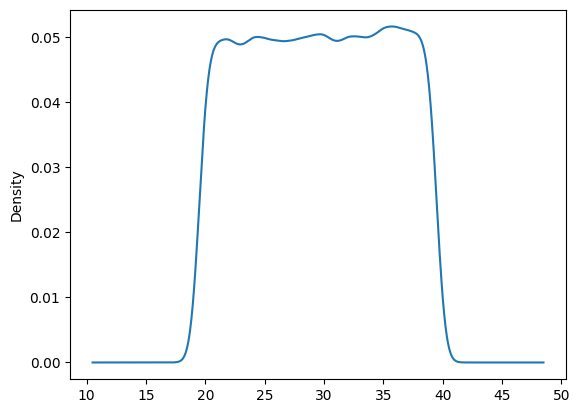

In [11]:
df.Delivery_person_Age.plot(kind='kde')

In [12]:
num_cols = df.select_dtypes(exclude='object').columns
cat_cols = df.select_dtypes(include='object').columns

In [13]:
df[num_cols].describe()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Vehicle_condition,multiple_deliveries,Time_taken(min),pickup_time,Day,Month,Year,is_weekend,Distance
count,43648.000000,43594.000000,41872.000000,41872.000000,41872.000000,41872.000000,45502.000000,44509.000000,45502.000000,45502.000000,45502.000000,45502.000000,45502.0,45502.000000,41872.000000
mean,29.555008,4.635287,18.913696,76.921664,18.977356,76.985325,1.019406,0.744928,26.297591,9.629357,13.811657,2.980726,2022.0,0.274867,9.731196
std,5.761482,0.313827,5.467265,3.503107,5.469056,3.503260,0.835229,0.572488,9.386419,4.424096,8.709540,0.546031,0.0,0.446452,5.609750
min,20.000000,2.500000,9.957144,72.768726,9.967144,72.778726,0.000000,0.000000,10.000000,0.000000,1.000000,2.000000,2022.0,0.000000,1.466861
25%,25.000000,4.500000,12.986047,73.897902,13.065996,73.940327,0.000000,0.000000,19.000000,5.000000,6.000000,3.000000,2022.0,0.000000,4.663357
50%,30.000000,4.700000,19.065838,76.618203,19.124049,76.662620,1.000000,1.000000,26.000000,10.000000,13.000000,3.000000,2022.0,0.000000,9.204269
75%,35.000000,4.900000,22.751234,78.368855,22.820040,78.405467,2.000000,1.000000,32.000000,15.000000,20.000000,3.000000,2022.0,1.000000,13.697670
max,39.000000,5.000000,30.914057,88.433452,31.054057,88.563452,3.000000,3.000000,54.000000,15.000000,31.000000,4.000000,2022.0,1.000000,20.995162


In [14]:
df[cat_cols].describe().T

,count,unique,top,freq
ID,45502,45502,0x4607,1
Delivery_person_ID,45502,1320,PUNERES01DEL01,67
Order_Date,45502,44,2022-03-15,1190
Weatherconditions,44977,6,Fog,7654
Road_traffic_density,44992,4,low,15477
Type_of_order,45502,4,snack,11512
Type_of_vehicle,45502,4,motorcycle,26427
Festival,45274,2,No,44380
City,44304,3,metropolitian,34029
City_name,45502,22,Jaipur,3439


<Axes: >

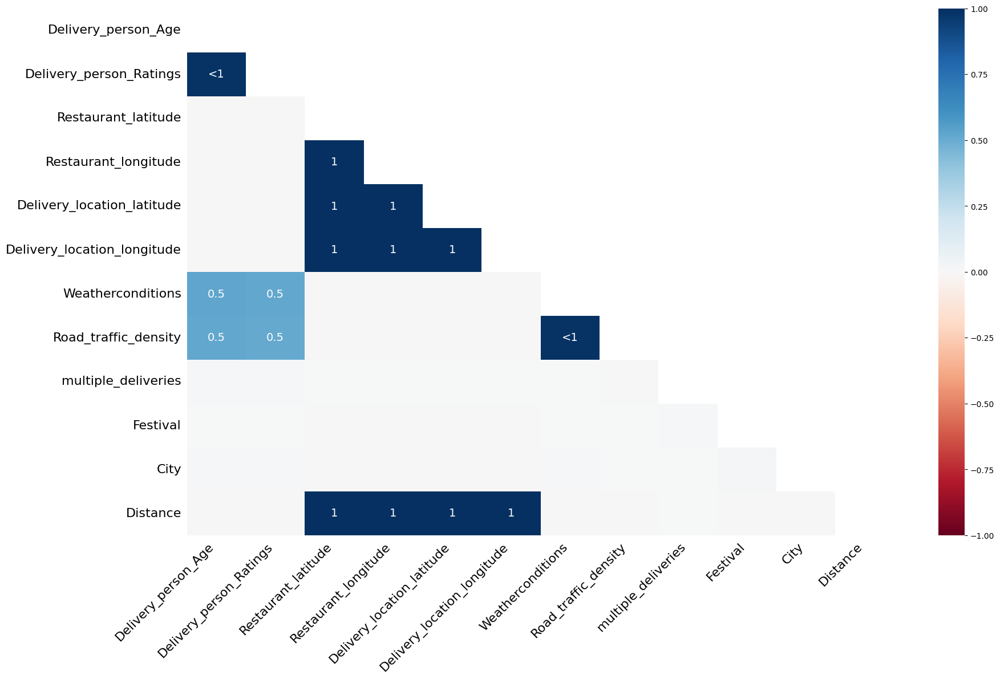

In [18]:
msno.heatmap(df)  # from here we can see the missing values are not at random

<Axes: xlabel='multiple_deliveries', ylabel='count'>

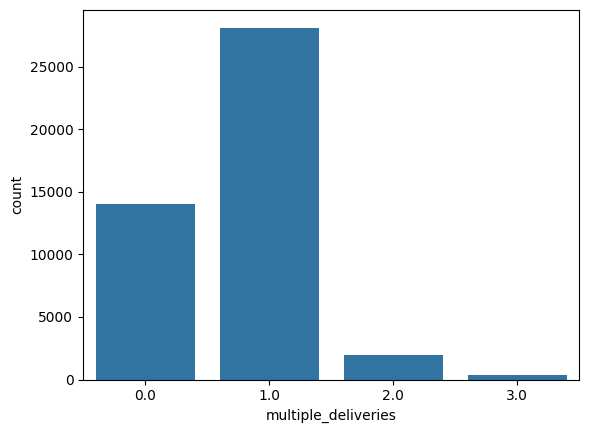

In [19]:
sns.countplot(x='multiple_deliveries', data=df)

In [26]:
from matplotlib.gridspec import GridSpec
def numerical_analysis(df,num_col,bins='auto'):
    fig = plt.figure(figsize=(10,10))
    grid = GridSpec(nrows=2,ncols=2,figure=fig)
    ax1=fig.add_subplot(grid[0,0])
    ax2=fig.add_subplot(grid[0,1])
    ax3=fig.add_subplot(grid[1,:])
    sns.boxplot(data = df , x=num_col ,ax=ax1)
    sns.kdeplot(data = df , x=num_col , ax=ax2)
    sns.histplot(data = df , x=num_col ,bins=bins,kde=True ,ax=ax3)
    plt.tight_layout()
def bivariate_analysis(df,num_col,cat_col):
    fig , axes = plt.subplots(2,2,figsize=(15,15))
    
    sns.barplot(data = df , x= num_col , y=cat_col, ax=axes[0,0] )
    sns.boxplot(data = df , x=num_col , y=cat_col , ax=axes[0,1])
    sns.violinplot(data = df , x=num_col , y=cat_col , ax=axes[1,0])
    sns.stripplot(data = df , x=num_col , y=cat_col , ax=axes[1,1])
    plt.tight_layout()
def multivariate_analysis(df , num_col ,cat_col1,cat_col2):
    fig , axes = plt.subplots(2,2,figsize=(15,15))
    sns.barplot(data=df , x=cat_col1 , y=num_col,hue=cat_col2,ax=axes[0,0])
    sns.boxplot(data=df , x=cat_col1 , y=num_col,hue=cat_col2,ax=axes[0,1])
    sns.violinplot(data=df , x=cat_col1 , y=num_col,hue=cat_col2,ax=axes[1,0])
    sns.stripplot(data=df , x=cat_col1 , y=num_col,hue=cat_col2,ax=axes[1,1])
    plt.tight_layout()
    plt.legend(bbox_to_anchor=(1,1))
def chi2_test(df,col1,col2,alpha=0.95):
    data = df.loc[:,[col1,col2]].dropna()
    ct = pd.crosstab(data[col1],data[col2])
    _,p_val,_,_ = chi2_contingency(ct)
    print(p_val)
    if p_val<0.05:
        print(f"We reject the null hypothesis','there is a significant association between {col1} and {col2}")
    else:
        print(f"We fail reject the null hypothesis','there is no significant association between {col1} and {col2}")
def anova_test(df,num_col,cat_col,alpha=0.95):
    data = df.loc[:,[num_col,cat_col]].dropna()
    cat_group = data.groupby(cat_col)[num_col].apply(list)
    f_statistic,p_val = f_oneway(*cat_group)
    print(f"F-statistic: {f_statistic}")
    print(f"P-value: {p_val}")
    if p_val<0.05:
        print(f"We reject the null hypothesis','there is a significant association between {num_col} and {cat_col}")
    else:
        print(f"We fail reject the null hypothesis','there is no significant association between {num_col} and {cat_col}")
def test_for_norm(df,col1,alpha=0.95):
    data = df[col1].dropna()
    _,p_val = jarque_bera(data)
    print(p_val)
    if p_val<0.05:
        print("We reject the null hypothesis , the data is not not normally distributed")
    else:
        print("We fail reject the null hypothesis , the date is normally distributed")


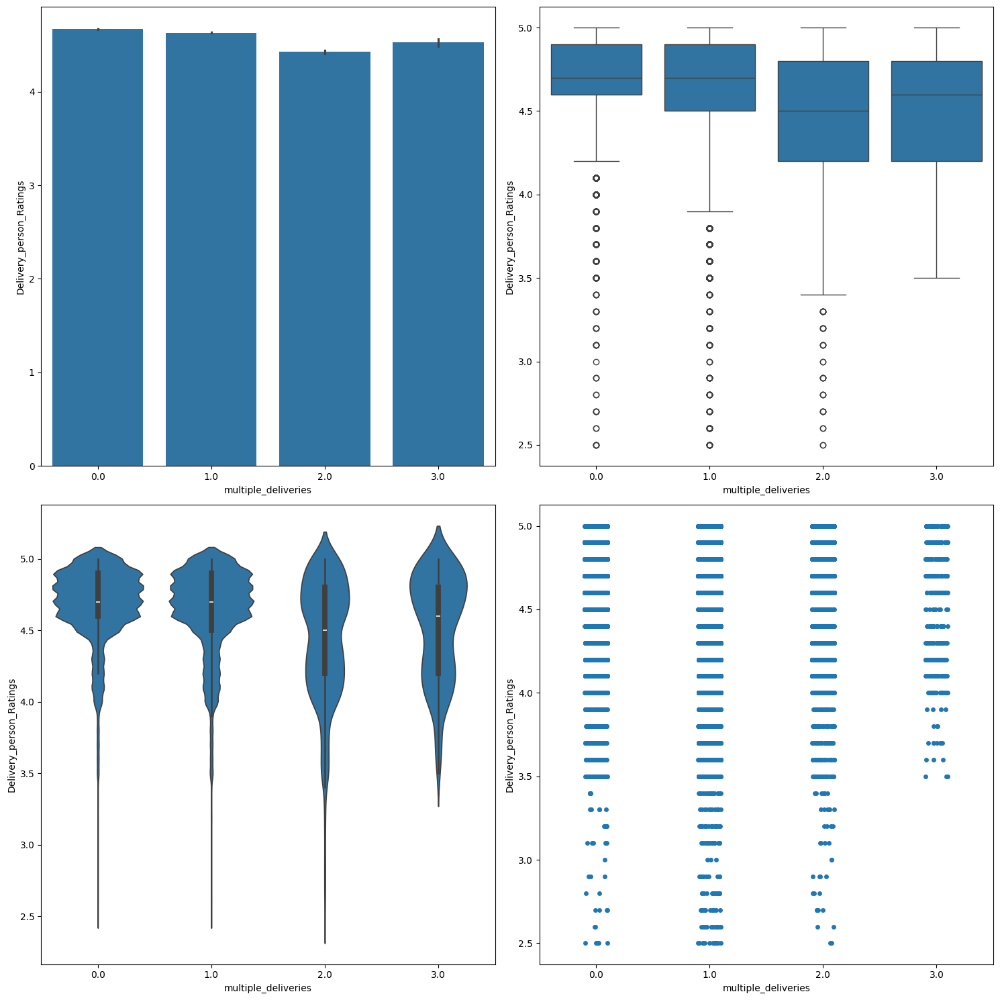

In [23]:
bivariate_analysis(df,'multiple_deliveries','Delivery_person_Ratings')

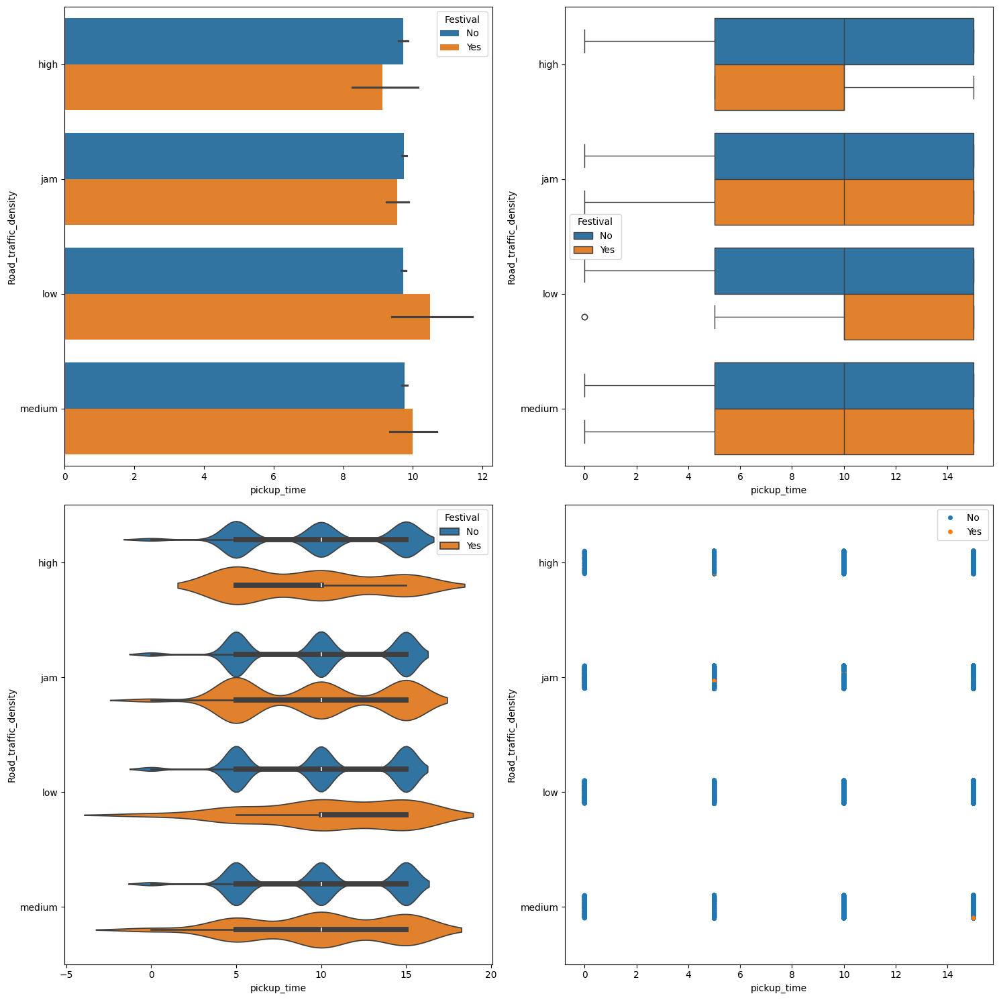

In [25]:
multivariate_analysis(df,'Road_traffic_density','pickup_time','Festival')

In [29]:
chi2_test(df,'Weatherconditions', 'Road_traffic_density')

0.4796388074753828
We fail reject the null hypothesis','there is no significant association between Weatherconditions and Road_traffic_density


In [30]:
df[['Weatherconditions', 'Road_traffic_density']].sample(30)  # if we observe the data we cant find relation b/w this 2 features as given by our chi square test

,Weatherconditions,Road_traffic_density
21763,Stormy,jam
39228,Sandstorms,low
15945,Sandstorms,jam
44656,Cloudy,low
8419,Windy,jam
32006,Windy,jam
25536,Cloudy,low
15049,Sunny,low
32638,Sandstorms,jam
26270,Fog,low


In [31]:
anova_test(df,'Delivery_person_Ratings','Weatherconditions')

F-statistic: 36.13522177142653
P-value: 4.596988879822299e-37
We reject the null hypothesis','there is a significant association between Delivery_person_Ratings and Weatherconditions


In [32]:
test_for_norm(df,'Delivery_person_Ratings')

0.0
We reject the null hypothesis , the data is not not normally distributed


# Time taken

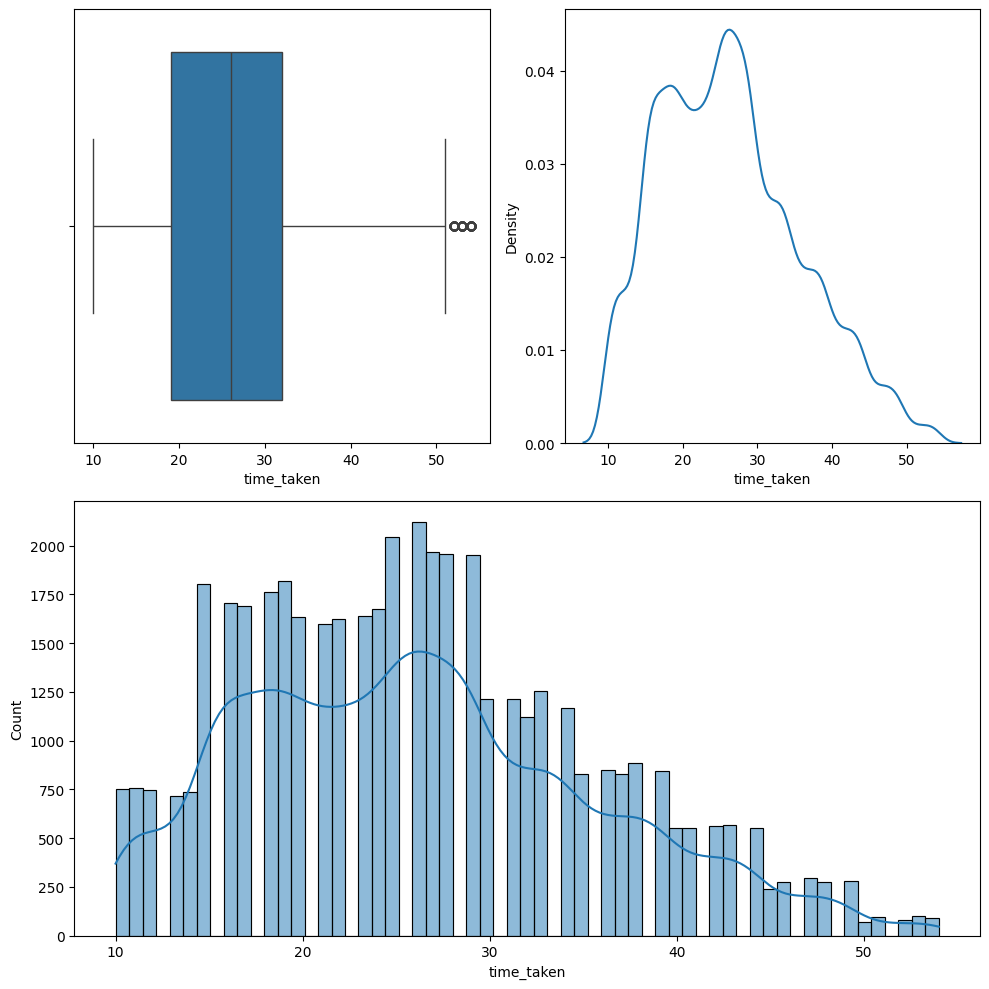

In [37]:
numerical_analysis(df,'time_taken')

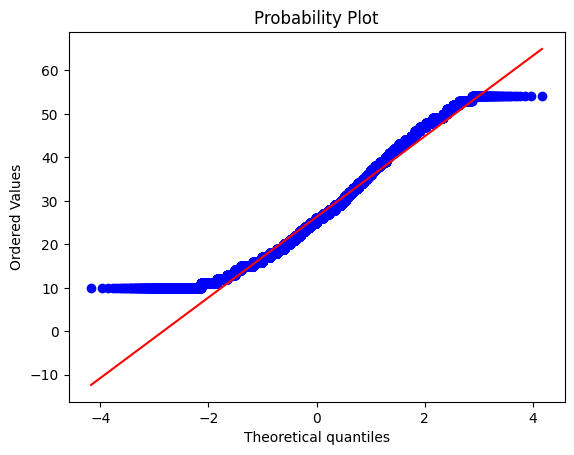

In [38]:
# QQ plot ##
probplot(df['time_taken'],plot=plt);

In [39]:
test_for_norm(df,'time_taken')

0.0
We reject the null hypothesis , the data is not not normally distributed


In [40]:
# check out rows where data is acting as outlier
def outlier_detect(df,col1 , col2):
    target_25_per , target_75_per = np.percentile(df[col1],[25,75]) 
    lower_fence = target_25_per - (1.5*(target_75_per-target_25_per))
    upper_fence = target_75_per + (1.5*(target_75_per-target_25_per))

    return df[(df[col1]<lower_fence)|(df[col1]>upper_fence)][col2].value_counts()
# from here we see those extreme time those looks like outlier are actually not outlier as evident from the traffic , as those late deliveries r due to high traffic and jam

In [41]:
outlier_detect(df,'time_taken','Road_traffic_density')

Road_traffic_density
jam     241
high     24
Name: count, dtype: int64

In [42]:
outlier_detect(df,'time_taken','Weatherconditions')
# weather is not affecting thr late deliveries

Weatherconditions
Fog           57
Sunny         51
Cloudy        44
Windy         44
Stormy        37
Sandstorms    32
Name: count, dtype: int64

In [43]:
target_25_per , target_75_per = np.percentile(df['time_taken'],[25,75]) 
lower_fence = target_25_per - (1.5*(target_75_per-target_25_per))
upper_fence = target_75_per + (1.5*(target_75_per-target_25_per))
avg_distance_extreme= df[(df.time_taken<lower_fence)|(df.time_taken>upper_fence)]['Distance'].mean()
avg_distance = df['Distance'].mean()
print( avg_distance , avg_distance_extreme)

9.731195634222226 13.308424362181938


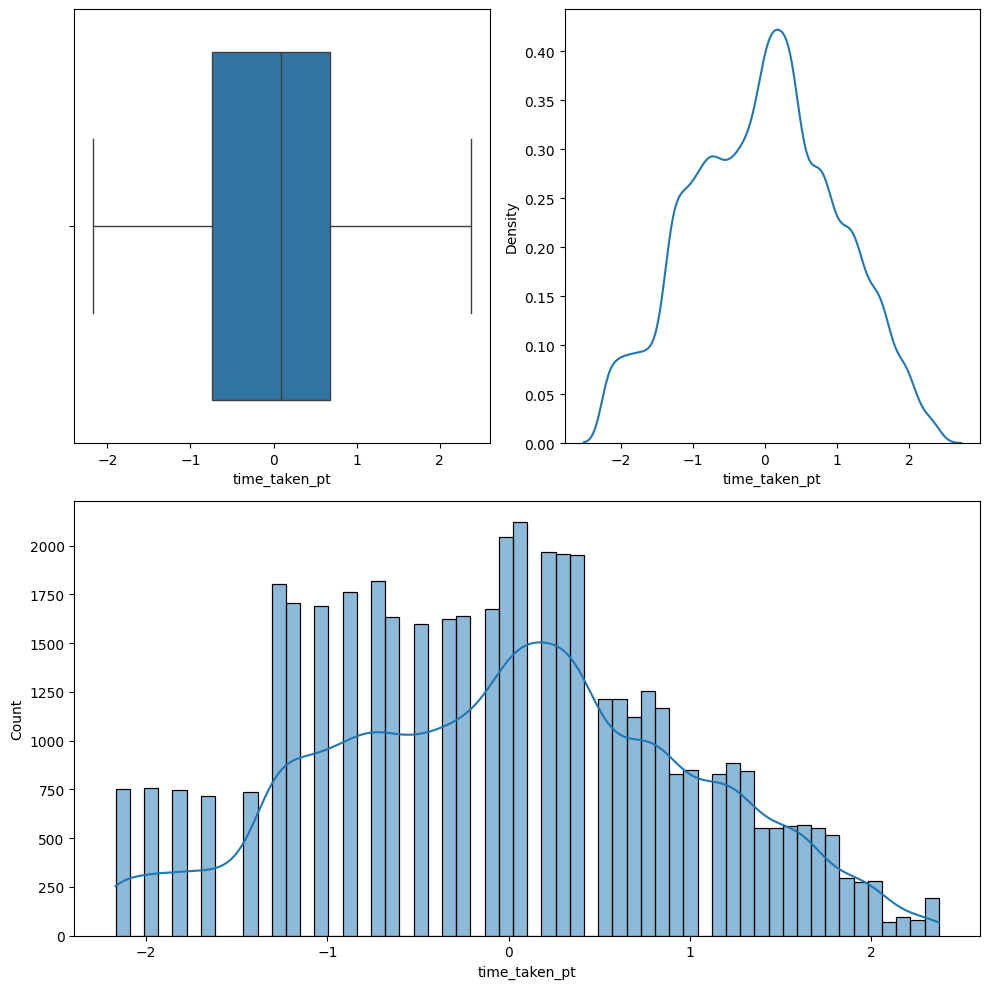

In [44]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson')
df['time_taken_pt']= pt.fit_transform(df[['time_taken']])
numerical_analysis(df,'time_taken_pt')

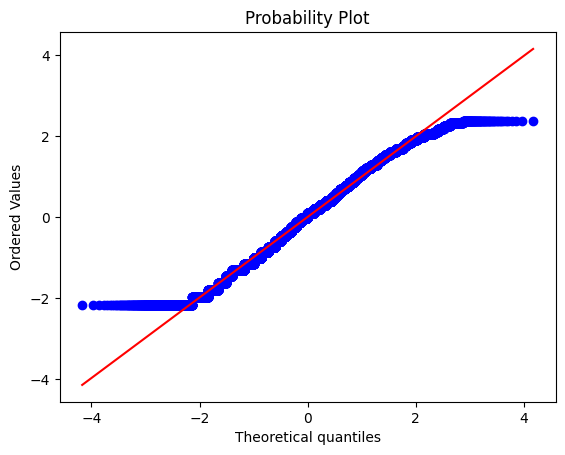

In [45]:
probplot(df['time_taken_pt'],plot=plt);

In [46]:
rider_id_group = df.groupby('Delivery_person_ID')[['Delivery_person_ID','Delivery_person_Age','Delivery_person_Ratings']]

In [47]:
rider_id_group.head(5).sort_values('Delivery_person_ID')

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings
92,AGRRES010DEL01,34.0,4.7
7738,AGRRES010DEL01,21.0,4.7
4554,AGRRES010DEL01,38.0,4.7
12416,AGRRES010DEL01,34.0,4.5
13223,AGRRES010DEL01,39.0,4.4
...,...,...,...
861,VADRES20DEL03,35.0,4.8
9792,VADRES20DEL03,30.0,4.6
9753,VADRES20DEL03,38.0,4.8
5094,VADRES20DEL03,35.0,4.9


In [48]:
df[['Delivery_person_ID','Delivery_person_Age','Delivery_person_Ratings']].dropna().duplicated(keep=False).sum()

10155

In [49]:
a = df[['Delivery_person_ID','Delivery_person_Age','Delivery_person_Ratings']].duplicated(keep=False)

In [50]:
df.loc[a , ['Delivery_person_ID','Delivery_person_Age', 'Delivery_person_Ratings']].dropna().sort_values(['Delivery_person_ID'])

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings
18533,AGRRES03DEL02,24.0,4.9
40285,AGRRES03DEL02,24.0,4.9
28473,AGRRES03DEL03,30.0,4.7
26275,AGRRES03DEL03,30.0,4.7
36131,AGRRES06DEL02,36.0,4.9
...,...,...,...
12742,VADRES20DEL02,28.0,4.5
5094,VADRES20DEL03,35.0,4.9
17963,VADRES20DEL03,35.0,4.9
21957,VADRES20DEL03,37.0,4.9


In [51]:
# WE THOUGHT OF imputing missing values based on rider id , but there for a given rider id there are multiple entries having different age and ratings so we cant impute missing values based on rider_id

# Age

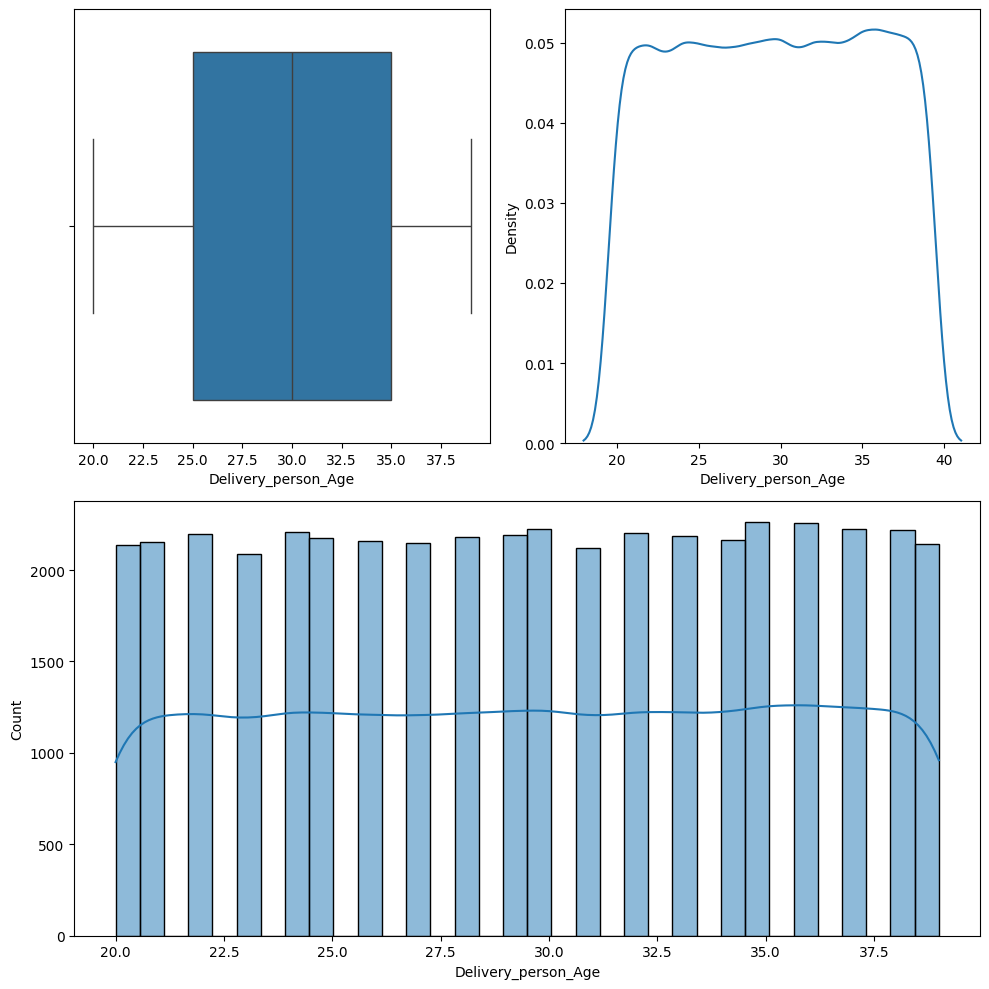

In [53]:
numerical_analysis(df,'Delivery_person_Age')

<Axes: xlabel='Delivery_person_Age', ylabel='time_taken'>

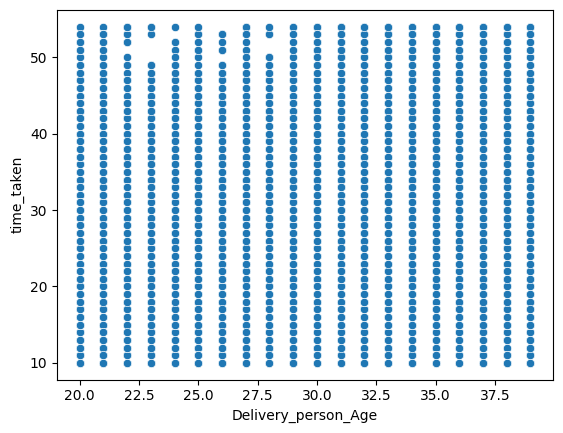

In [54]:
sns.scatterplot(data=df,x='Delivery_person_Age',y='time_taken') 

Age of the rider dont show any impact on timetaken to deliver

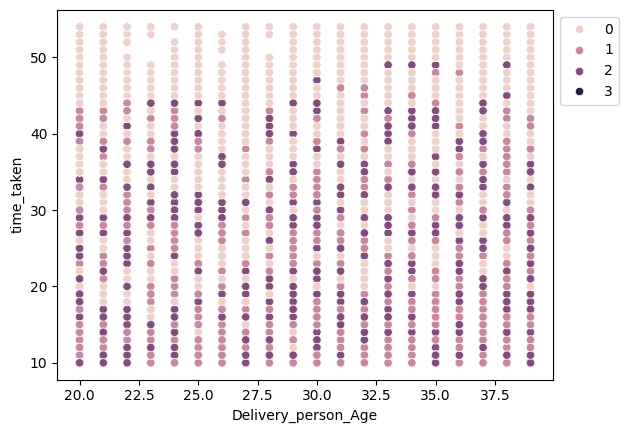

In [55]:
sns.scatterplot(data=df,x='Delivery_person_Age',y='time_taken',hue='Vehicle_condition') 
plt.legend(bbox_to_anchor=(1,1))

Here we see the time_taken is more when the vehicle condtition is bad as evident from the scatterplot

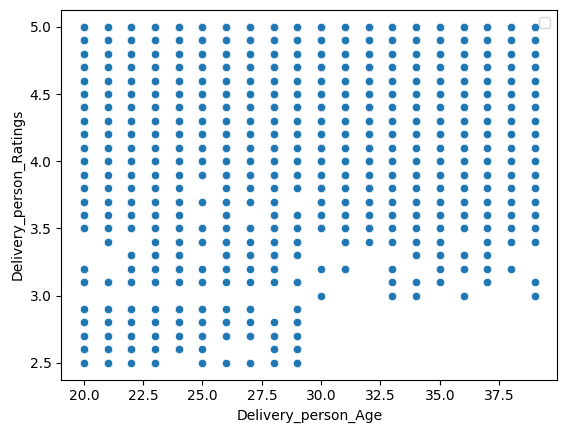

In [56]:
sns.scatterplot(data=df,x='Delivery_person_Age',y='Delivery_person_Ratings') 
plt.legend(bbox_to_anchor=(1,1))

# Rating

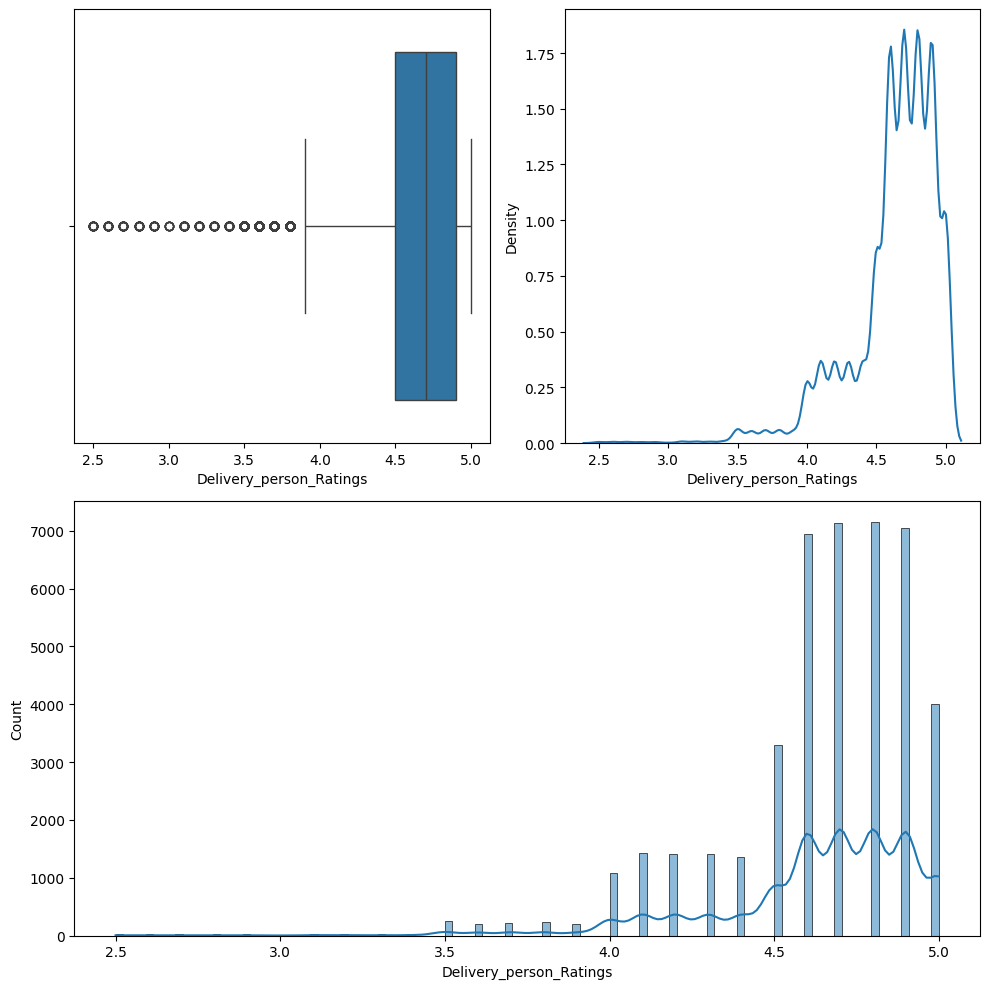

In [57]:
numerical_analysis(df,'Delivery_person_Ratings')

<Axes: xlabel='Delivery_person_Ratings', ylabel='time_taken'>

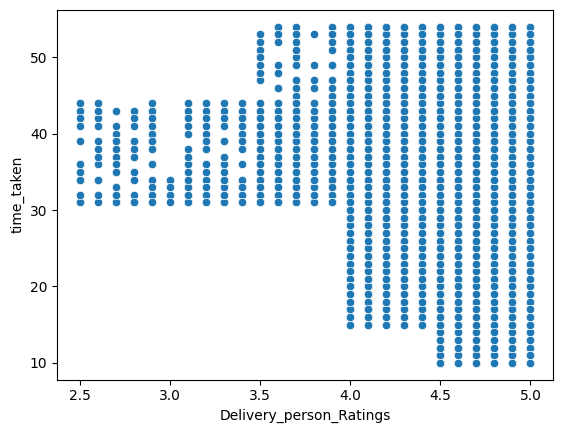

In [58]:
sns.scatterplot(data=df,x='Delivery_person_Ratings',y='time_taken')

It seems like riders with more ratings get more orders
Higher ratings equate to more work and more income oppurtunitie

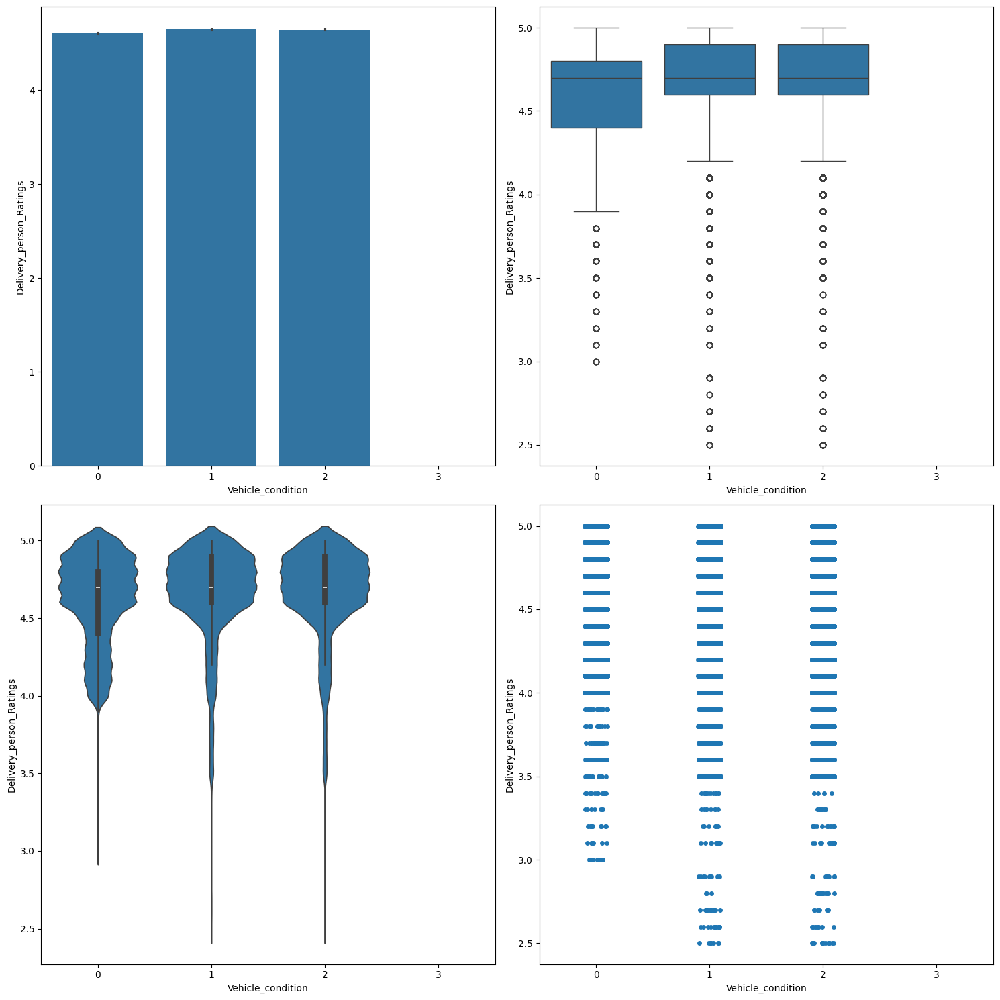

In [59]:
# do vehicle condition impact ratings
bivariate_analysis(df,'Vehicle_condition','Delivery_person_Ratings')

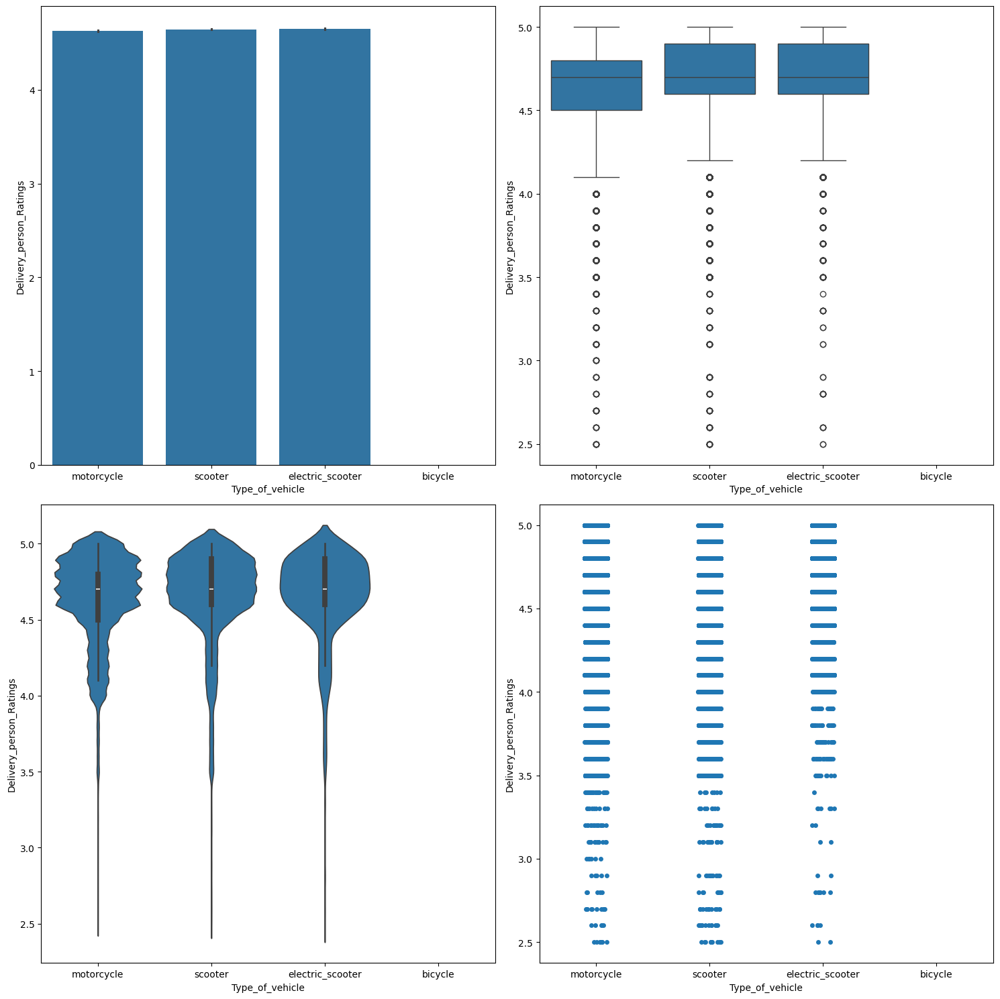

In [60]:
# does type of vehicle affect rating
bivariate_analysis(df,'Type_of_vehicle','Delivery_person_Ratings')

In [61]:
df[df['Type_of_vehicle']=='bicycle']['Delivery_person_Ratings'] # BICYCLE column is missing from our plot as it has all nan values

1142    NaN
1378    NaN
1624    NaN
1681    NaN
1961    NaN
2800    NaN
3951    NaN
5211    NaN
5276    NaN
5713    NaN
6310    NaN
7207    NaN
7750    NaN
8316    NaN
8828    NaN
10279   NaN
10488   NaN
11292   NaN
11981   NaN
12518   NaN
12915   NaN
14138   NaN
15316   NaN
15706   NaN
16077   NaN
17176   NaN
17934   NaN
19920   NaN
20679   NaN
21123   NaN
21358   NaN
22508   NaN
22651   NaN
23354   NaN
24232   NaN
24773   NaN
24838   NaN
27320   NaN
29266   NaN
30532   NaN
32727   NaN
35464   NaN
35564   NaN
36387   NaN
36969   NaN
37775   NaN
40527   NaN
40585   NaN
42742   NaN
43076   NaN
43319   NaN
44977   NaN
45303   NaN
Name: Delivery_person_Ratings, dtype: float64

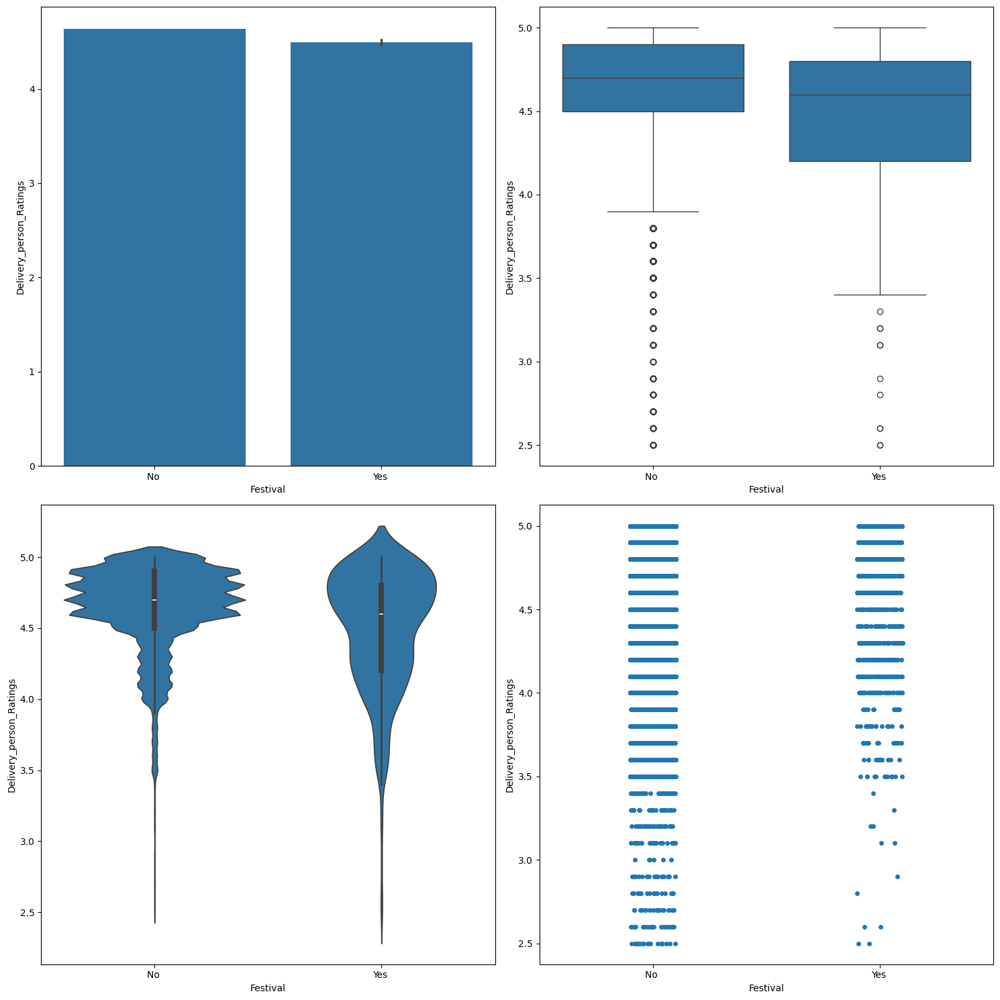

In [62]:
# does festival impact rating
bivariate_analysis(df,'Festival','Delivery_person_Ratings')

during festivals , ratings tend to decrease

In [63]:

import plotly.express as px
location_subset = df.loc[:,df.columns[4:8].tolist() + ["City_name"]]

location_subset

,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,City_name
0,22.745049,75.892471,22.765049,75.912471,Indore
1,12.913041,77.683237,13.043041,77.813237,Bangalore
2,12.914264,77.678400,12.924264,77.688400,Bangalore
3,11.003669,76.976494,11.053669,77.026494,Coimbatore
4,12.972793,80.249982,13.012793,80.289982,Chennai
...,...,...,...,...,...
45497,26.902328,75.794257,26.912328,75.804257,Jaipur
45498,NaN,NaN,NaN,NaN,Agra
45499,13.022394,80.242439,13.052394,80.272439,Chennai
45500,11.001753,76.986241,11.041753,77.026241,Coimbatore


In [64]:
delivery_df = pd.DataFrame({
    'latitude': location_subset['Delivery_location_latitude'],
    'longitude': location_subset['Delivery_location_longitude'],
    "city_name": location_subset["City_name"]
})


# Create a map using Plotly's scatter_mapbox
fig = px.scatter_mapbox(
    delivery_df,
    lat='latitude',
    lon='longitude',
    title="Delivery Points",
    hover_name="city_name"
)

# Update the layout for the map of India
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 20.5937, "lon": 78.9629},  # Centered over India
    mapbox_zoom=3,
)

# Show the plot
fig.show()

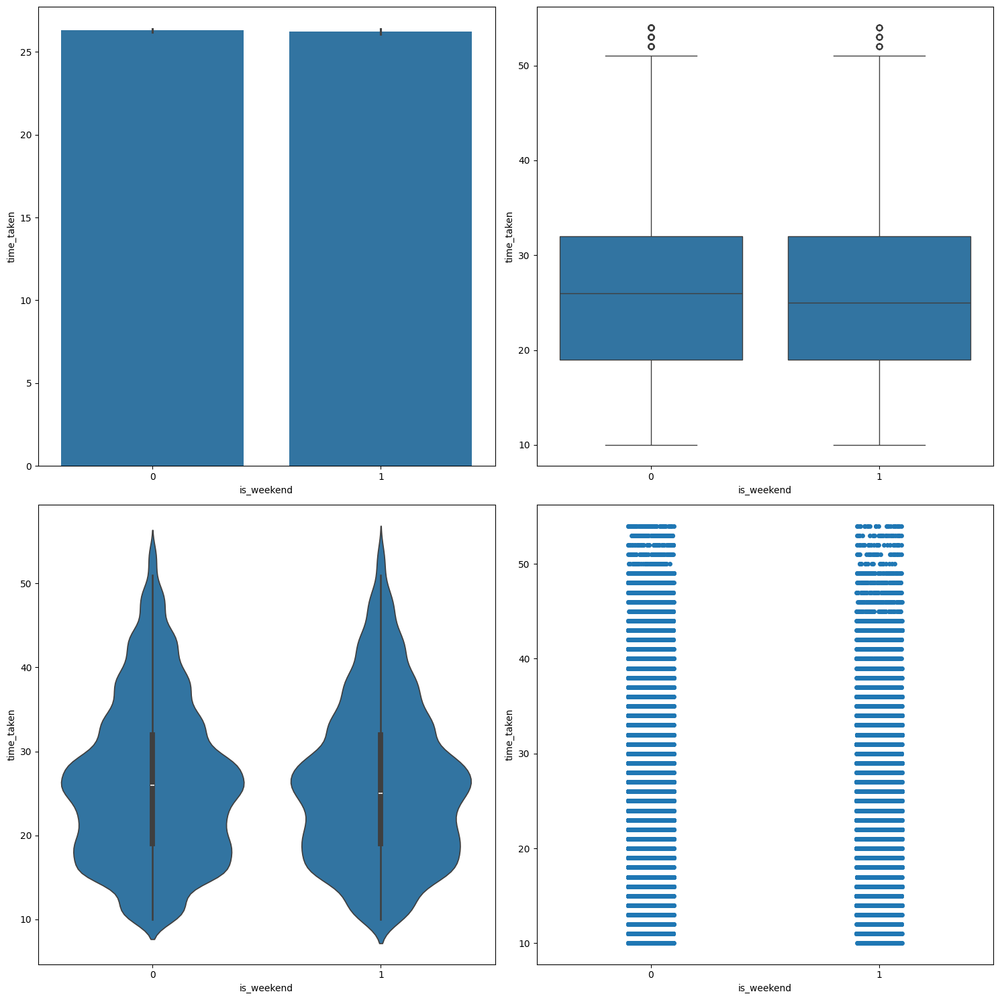

In [65]:
bivariate_analysis(df,'is_weekend','time_taken')

In [66]:
# do weekends have an impact on traffic
chi2_test(df,'is_weekend','Road_traffic_density')

0.6845961396354259
We fail reject the null hypothesis','there is no significant association between is_weekend and Road_traffic_density


In [67]:
# do multiple deliveries and weekends r linked
chi2_test(df,'is_weekend','multiple_deliveries')

0.6929801850384227
We fail reject the null hypothesis','there is no significant association between is_weekend and multiple_deliveries


In [68]:
anova_test(df,'is_weekend','time_taken')

F-statistic: 1.087283508568384
P-value: 0.31975304956273204
We fail reject the null hypothesis','there is no significant association between is_weekend and time_taken


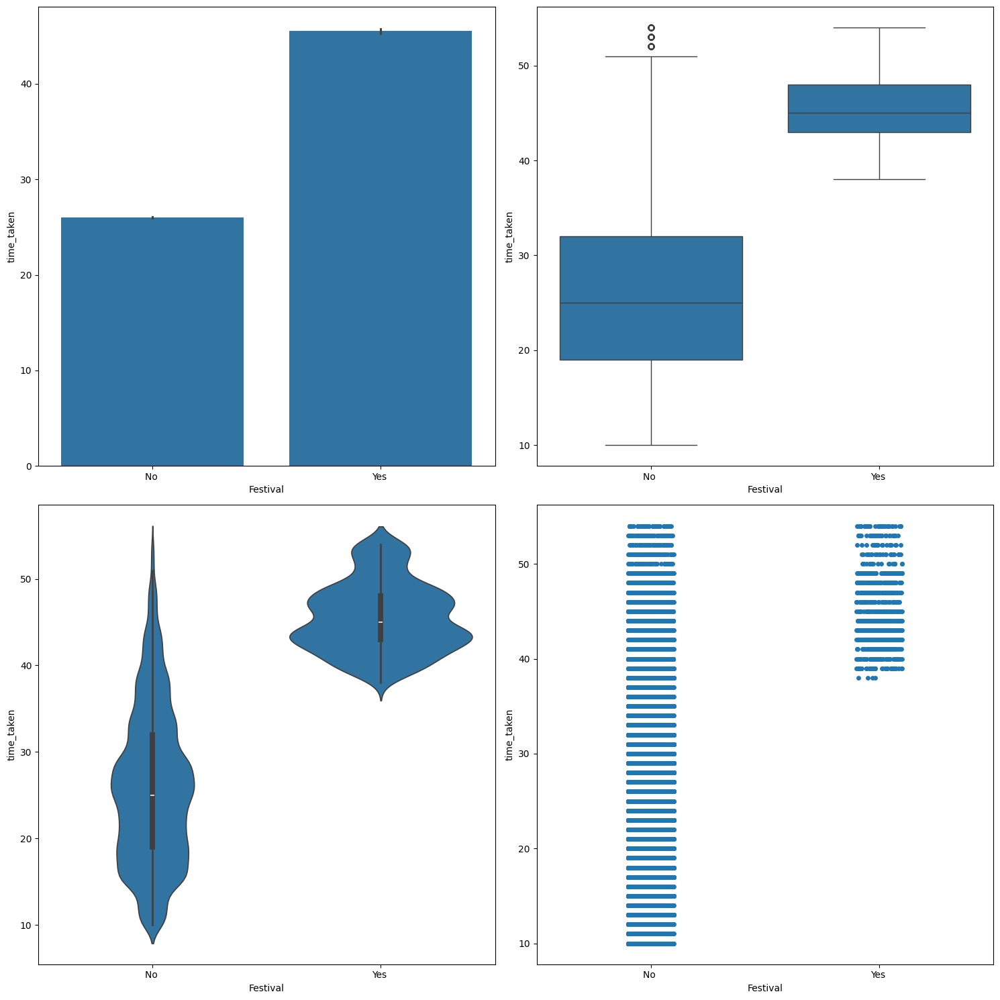

In [69]:
# do time taken increase with festival
bivariate_analysis(df,'Festival','time_taken')

In [70]:
chi2_test(df,'Festival','Road_traffic_density') # SO road traffic increased with festiva

1.1223471129146869e-153
We reject the null hypothesis','there is a significant association between Festival and Road_traffic_density


In [71]:
df.pivot_table(index='Road_traffic_density',columns='Festival',values='time_taken')

Festival,No,Yes
Road_traffic_density,,
high,27.010373,45.826087
jam,30.538039,46.093651
low,21.284332,42.020000
medium,26.550288,43.715385


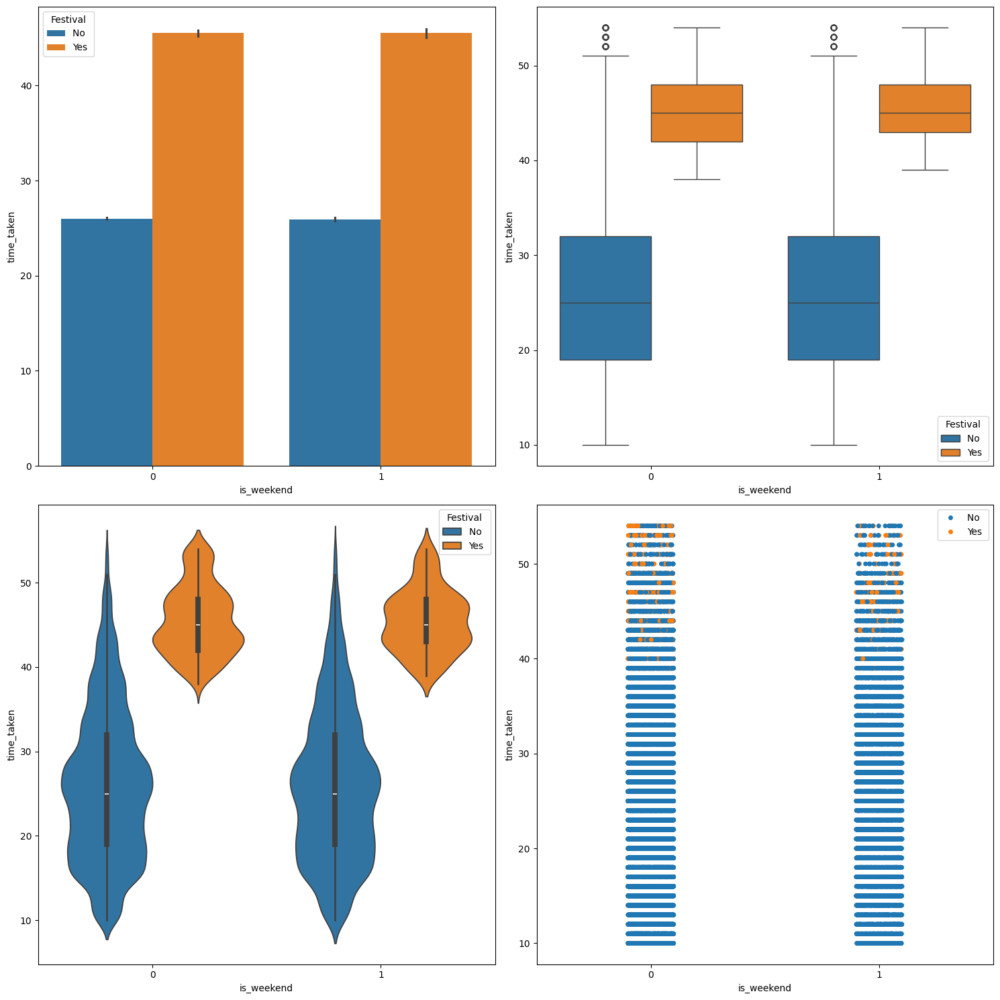

In [72]:
# do both weekend and festival together impact time taken for delivery
multivariate_analysis(df,'time_taken','is_weekend','Festival')

We can clearly see Weekend and Festival highly impacts the time taken

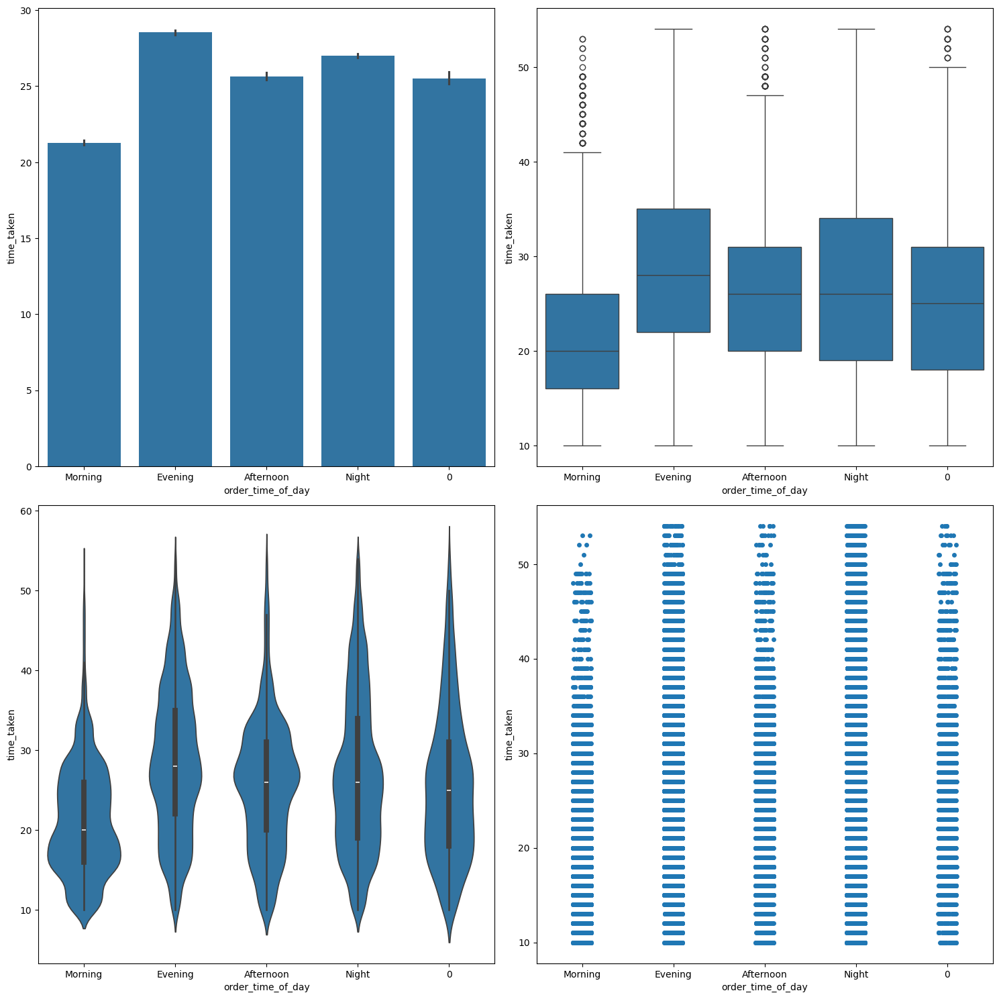

In [73]:
bivariate_analysis(df,'order_time_of_day' , 'time_taken')

In morning , the time taken is the least

In [74]:
df['order_time_of_day'].value_counts() # night and evening time has the most orders placed

order_time_of_day
Night        18312
Evening      13353
Morning       7718
Afternoon     4049
0             2070
Name: count, dtype: int64

<Axes: xlabel='order_time_of_day', ylabel='count'>

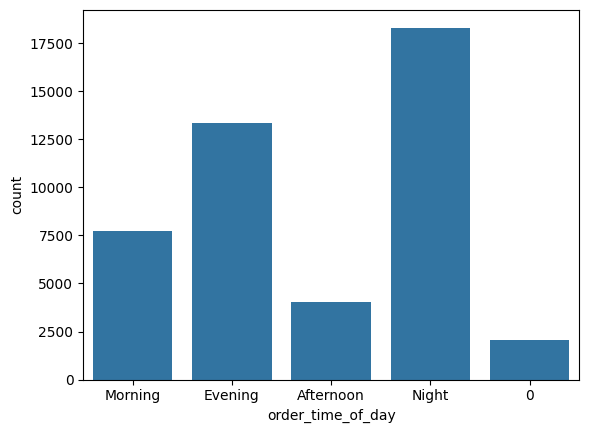

In [75]:
sns.countplot(data=df,x='order_time_of_day')

<Axes: xlabel='pickup_time'>

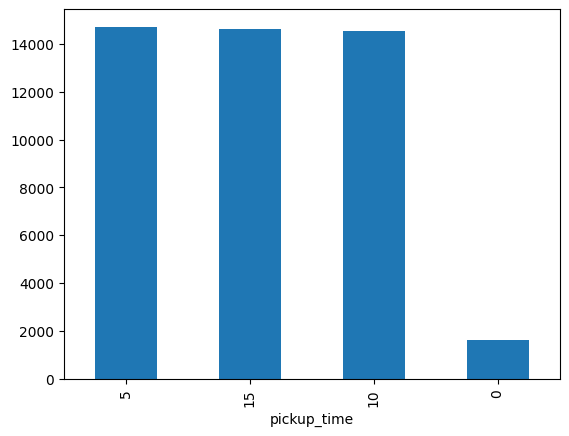

In [76]:
df.pickup_time.value_counts().plot(kind='bar') # quite uniform distn

In [77]:
df['pickup_time']=df['pickup_time'].astype(object) # since pickup time has only 3 categories lets treat it as a object

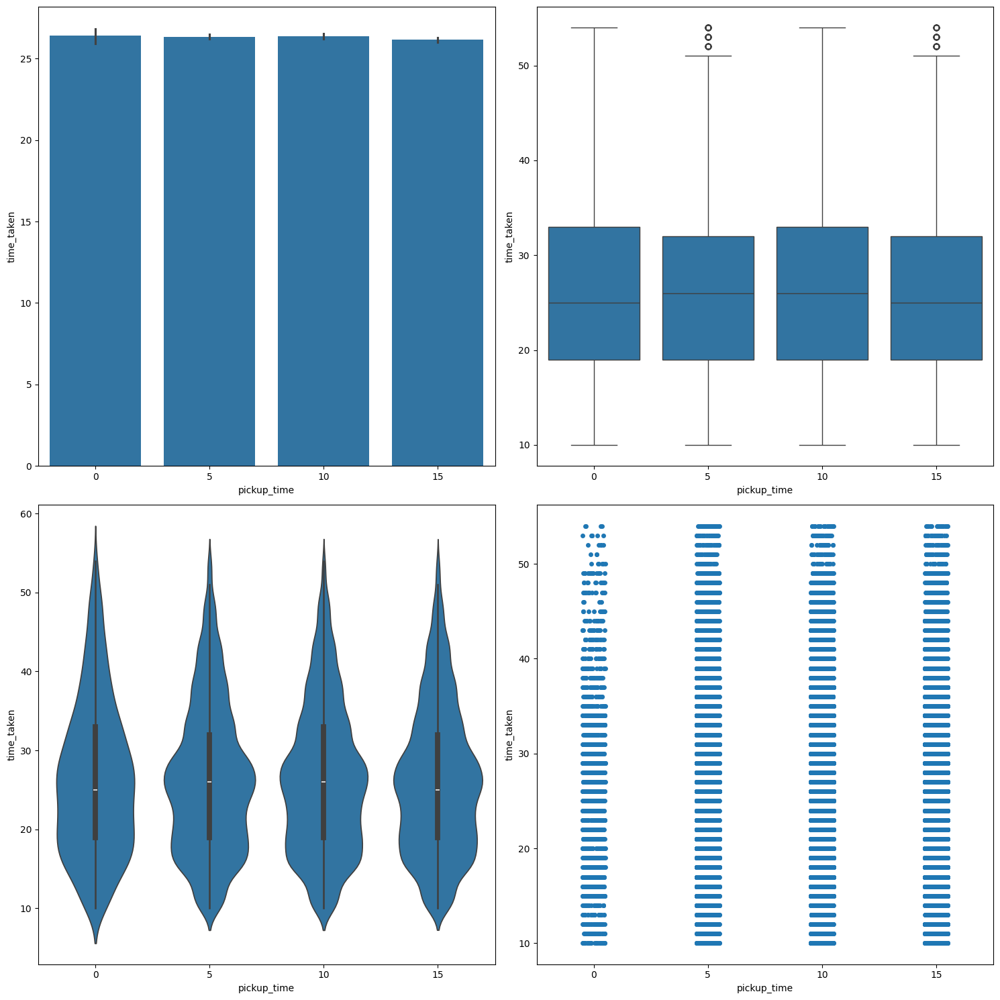

In [78]:
bivariate_analysis(df,'pickup_time','time_taken') # as seen from values counts , from plot also we see they r pretty uniform

In [79]:
# does traffic depend on city
chi2_test(df,'City','Road_traffic_density')

2.3390790568495405e-104
We reject the null hypothesis','there is a significant association between City and Road_traffic_density


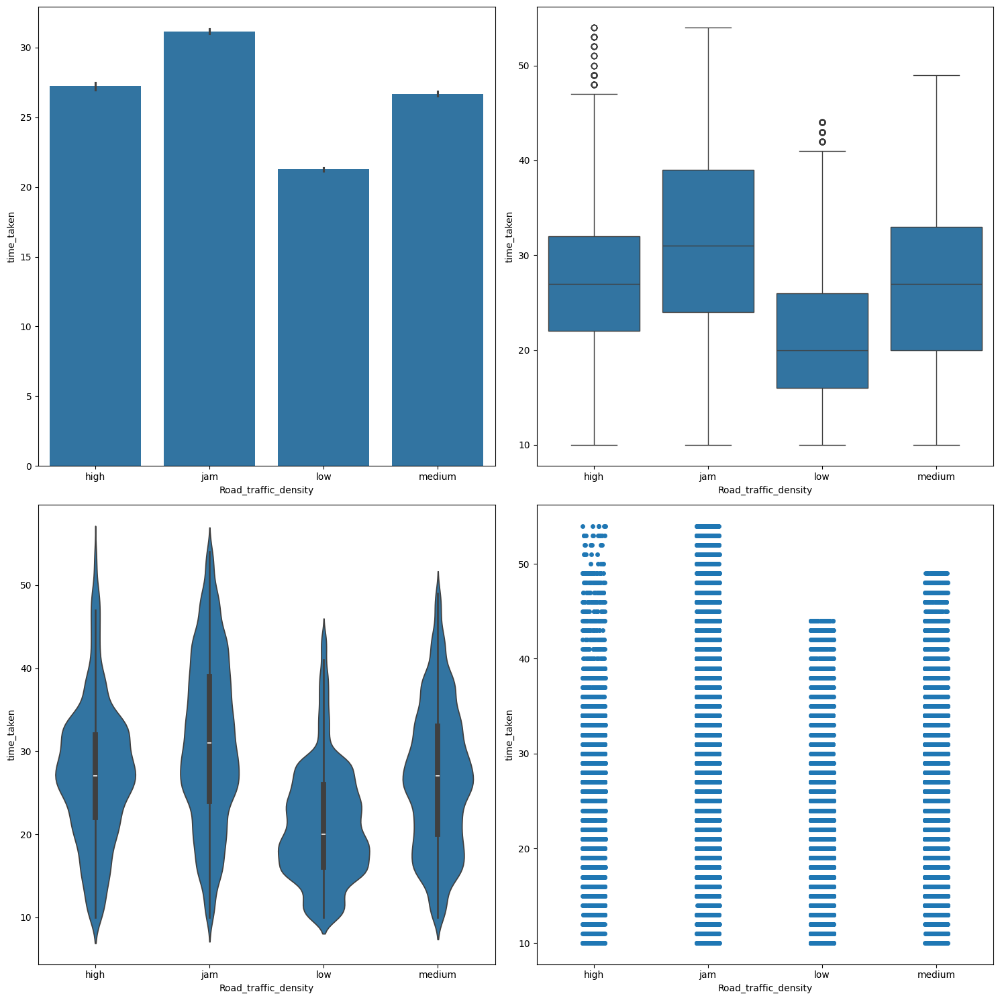

In [80]:
# does traffic affect delivery times
bivariate_analysis(df,'Road_traffic_density','time_taken')

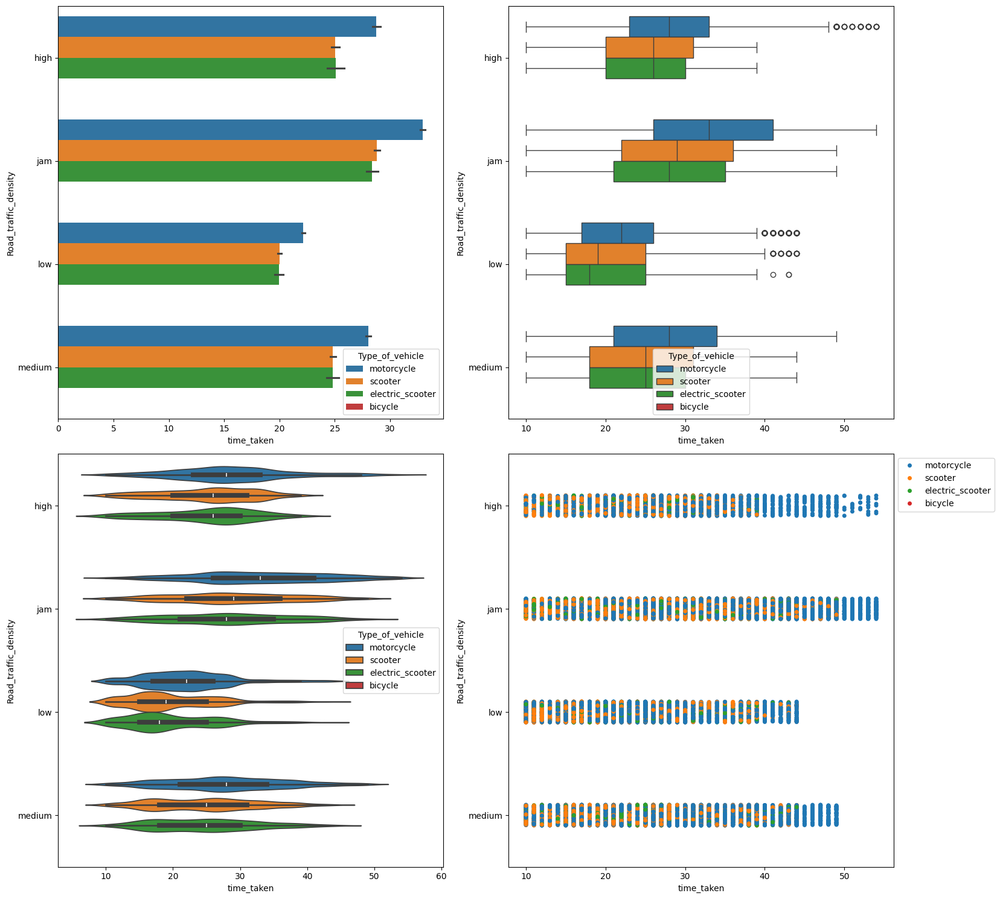

In [81]:
# are some vehicle types more suitable in traffic than others
multivariate_analysis(df,'Road_traffic_density','time_taken','Type_of_vehicle')

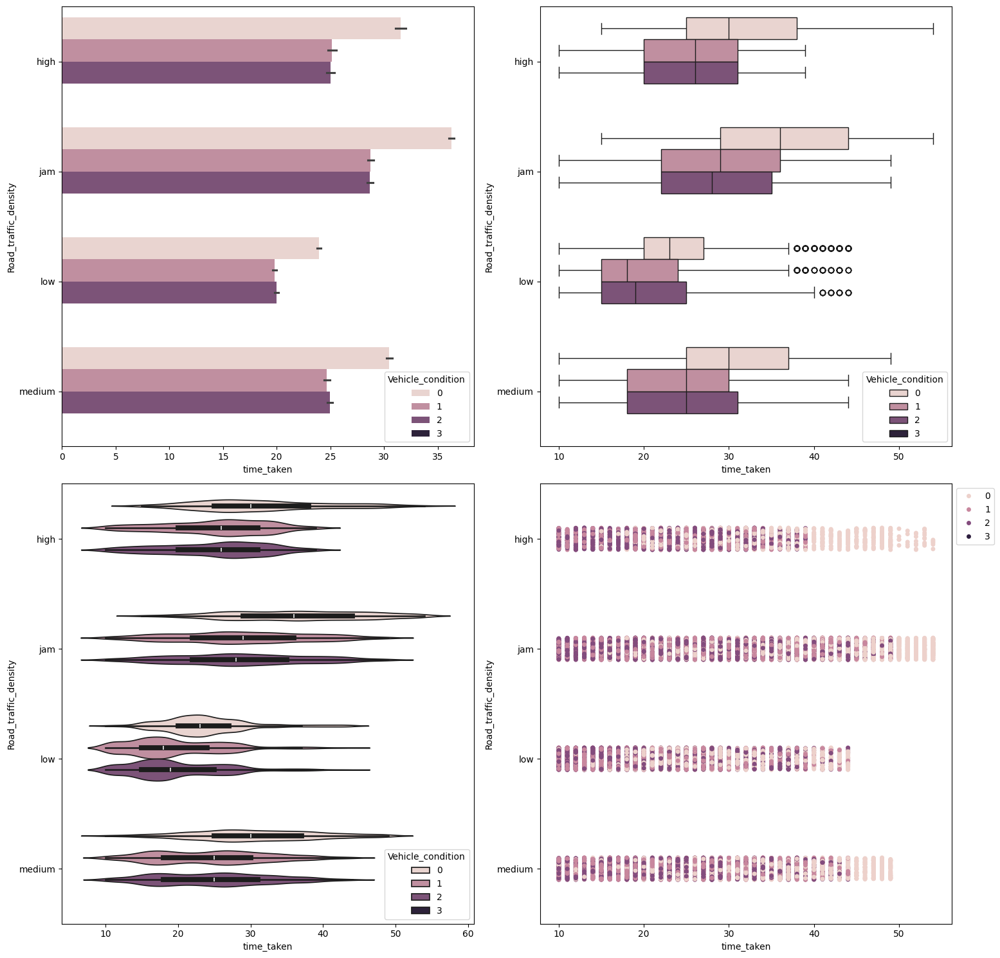

In [82]:
# does vehicle confition in traffic affect delivery times
multivariate_analysis(df,'Road_traffic_density','time_taken','Vehicle_condition')

Dont make wrong interpretations that good condition vehicles takes longer times on avg

This simply means that good vehicles are preferred for deliveries during festivals which results in longer delivery times

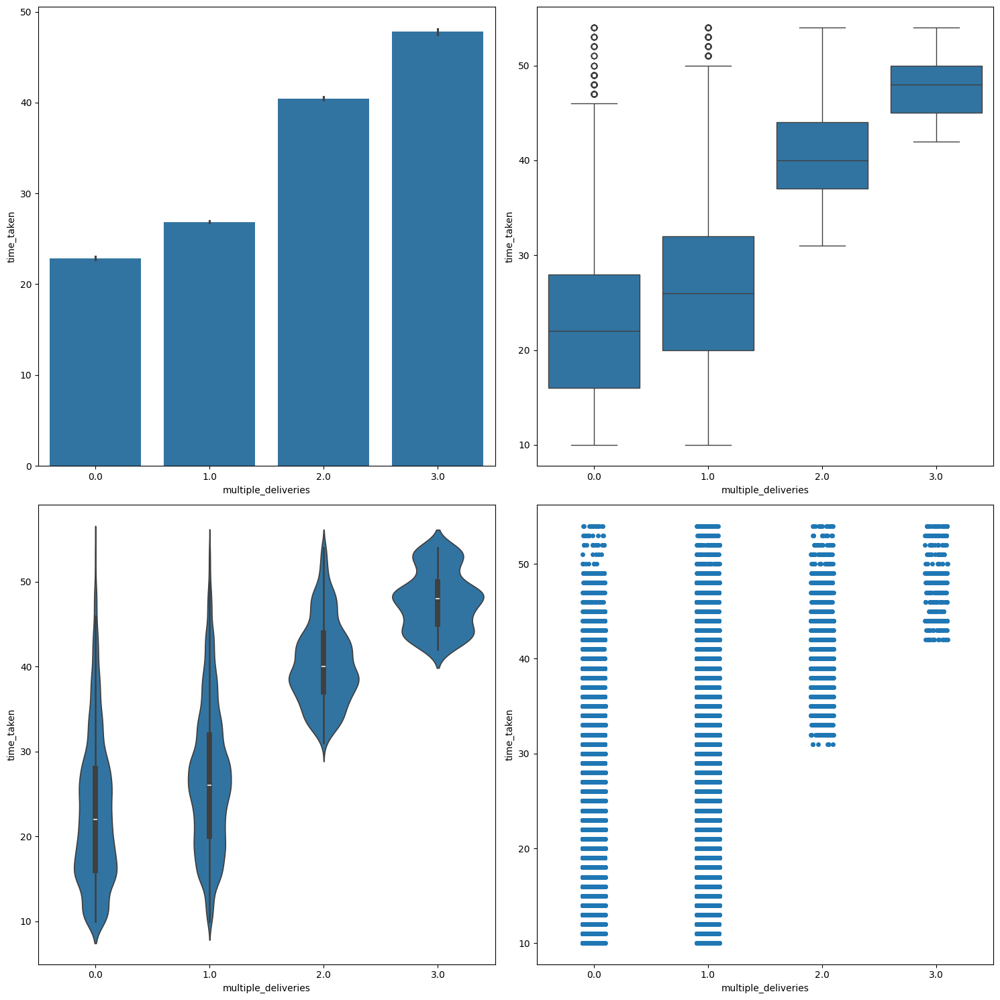

In [83]:
# does multiple delivereis affect delivery times

bivariate_analysis(df, "multiple_deliveries", "time_taken")

# Weather

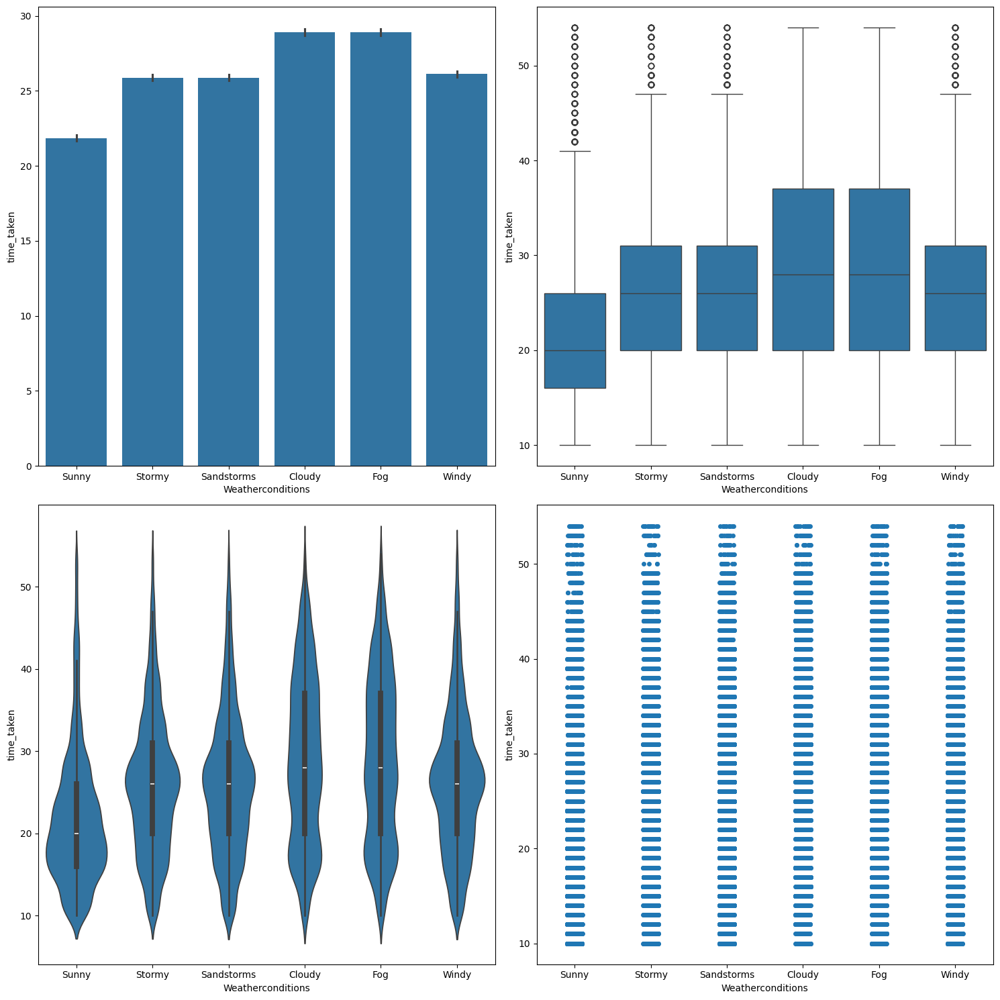

In [84]:
# does weather affect delivery times

bivariate_analysis(df, "Weatherconditions", "time_taken")

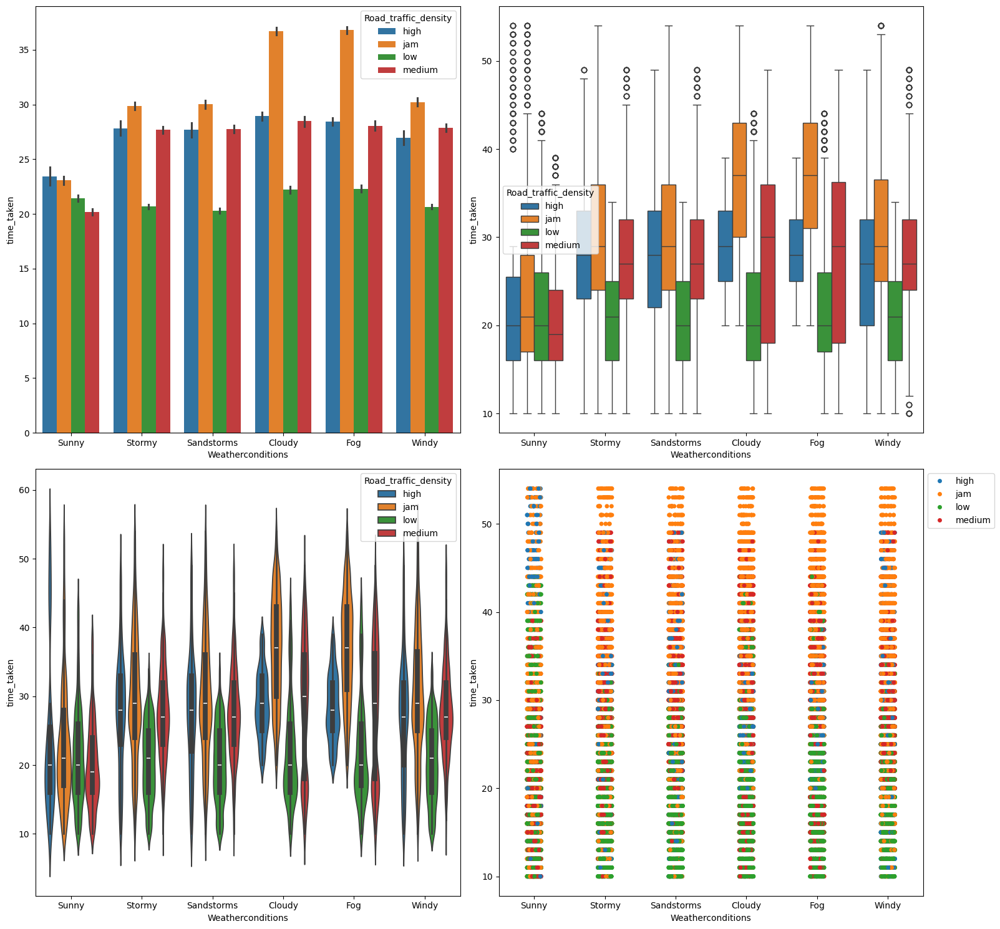

In [85]:
# delivery times based on weather and traffic

multivariate_analysis(df, "time_taken", "Weatherconditions", "Road_traffic_density")

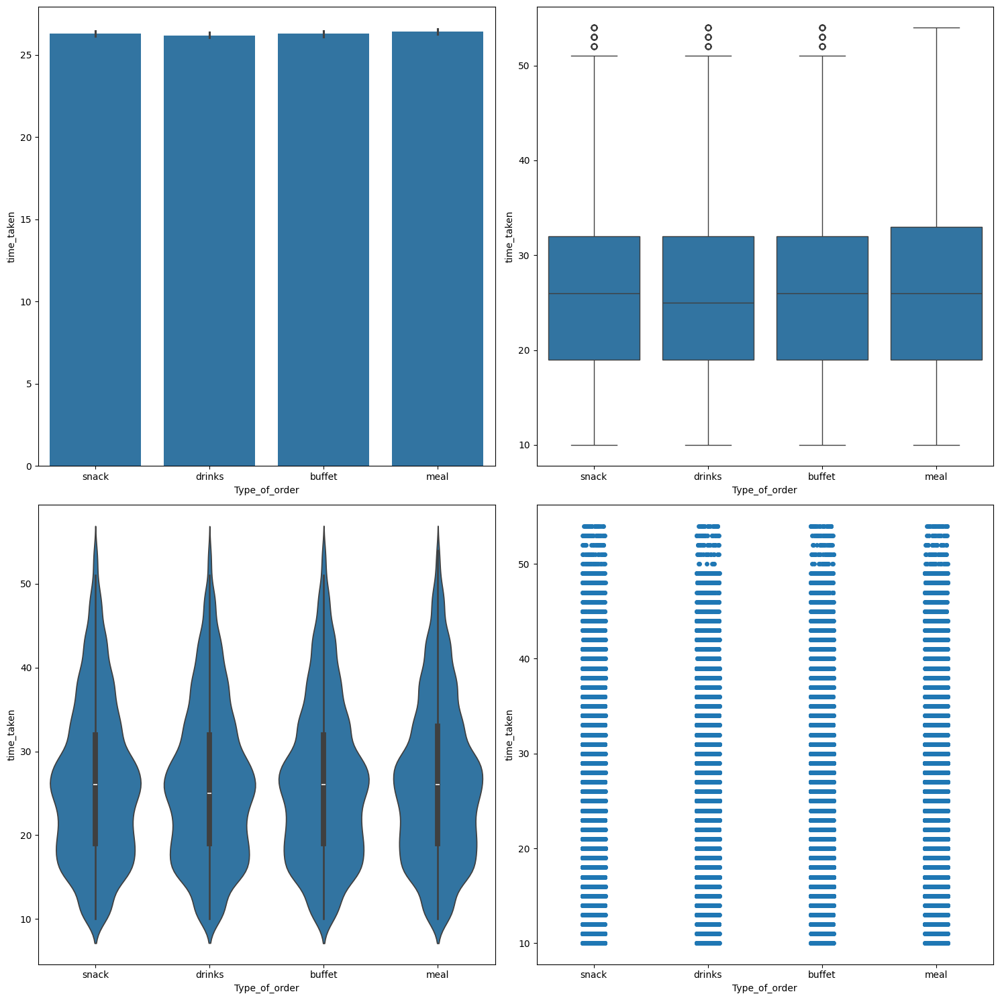

In [86]:
bivariate_analysis(df,'Type_of_order','time_taken')

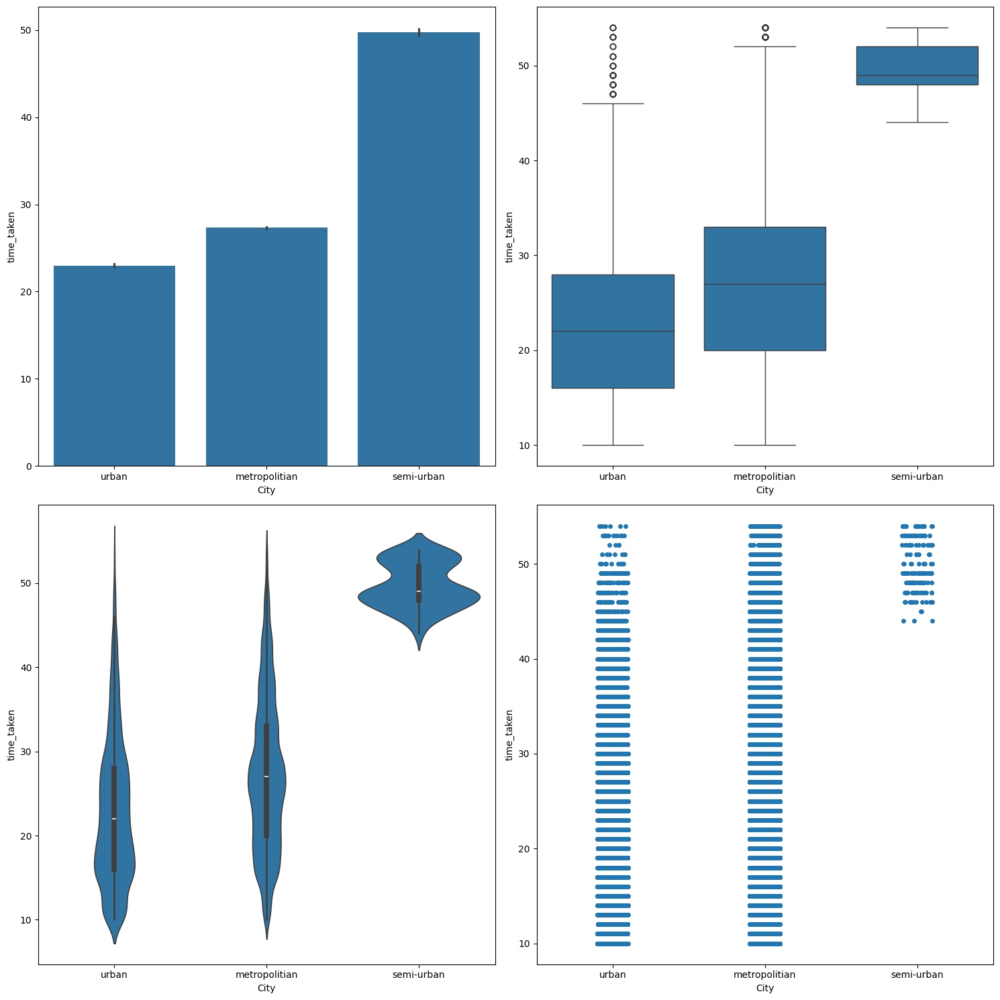

In [87]:
bivariate_analysis(df,'City','time_taken')

semi - urban takes the highest time compared to others

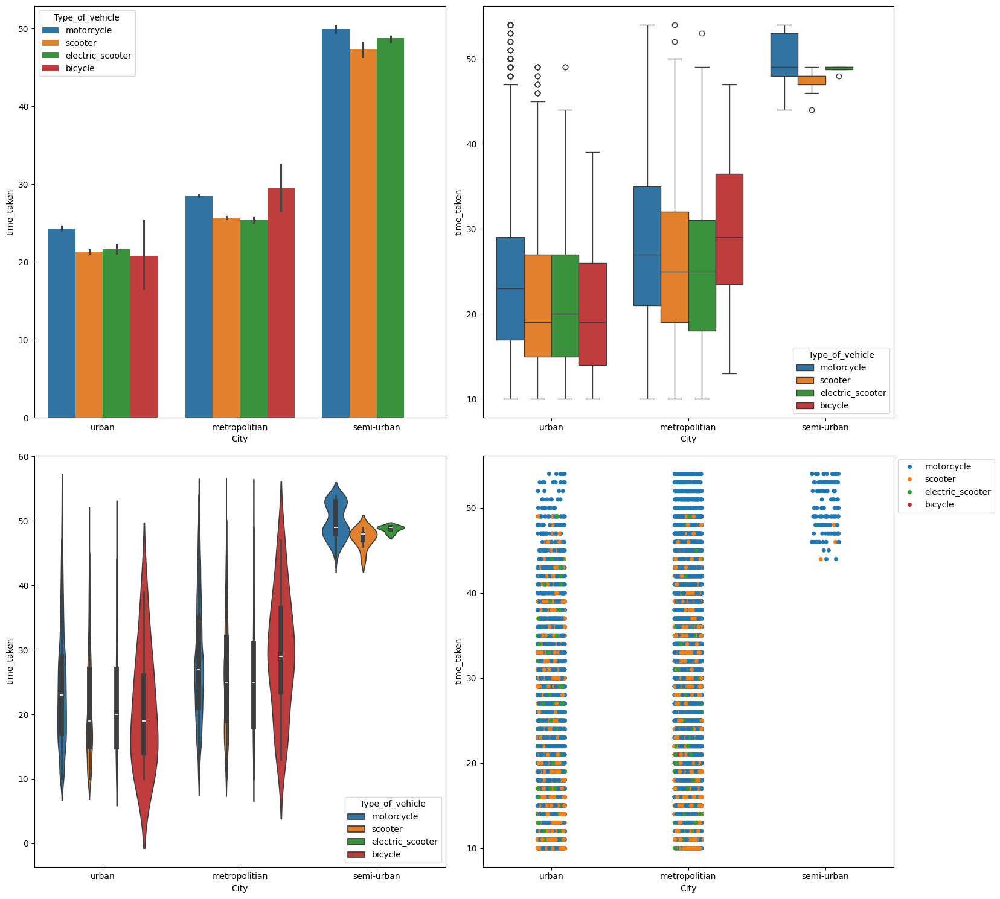

In [88]:
multivariate_analysis(df,'time_taken','City','Type_of_vehicle')

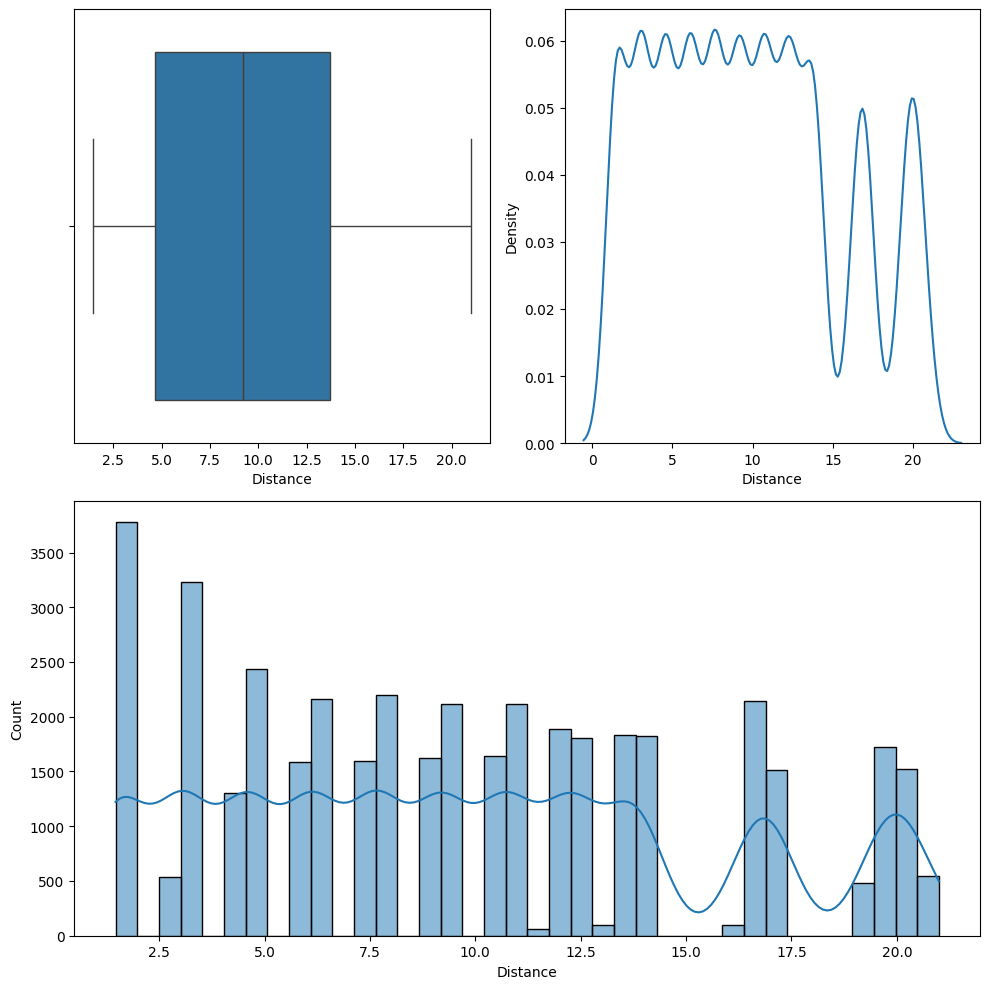

In [89]:
numerical_analysis(df,'Distance')

In [90]:
df[['Distance','time_taken']].corr()

,Distance,time_taken
Distance,1.000000,0.320705
time_taken,0.320705,1.000000


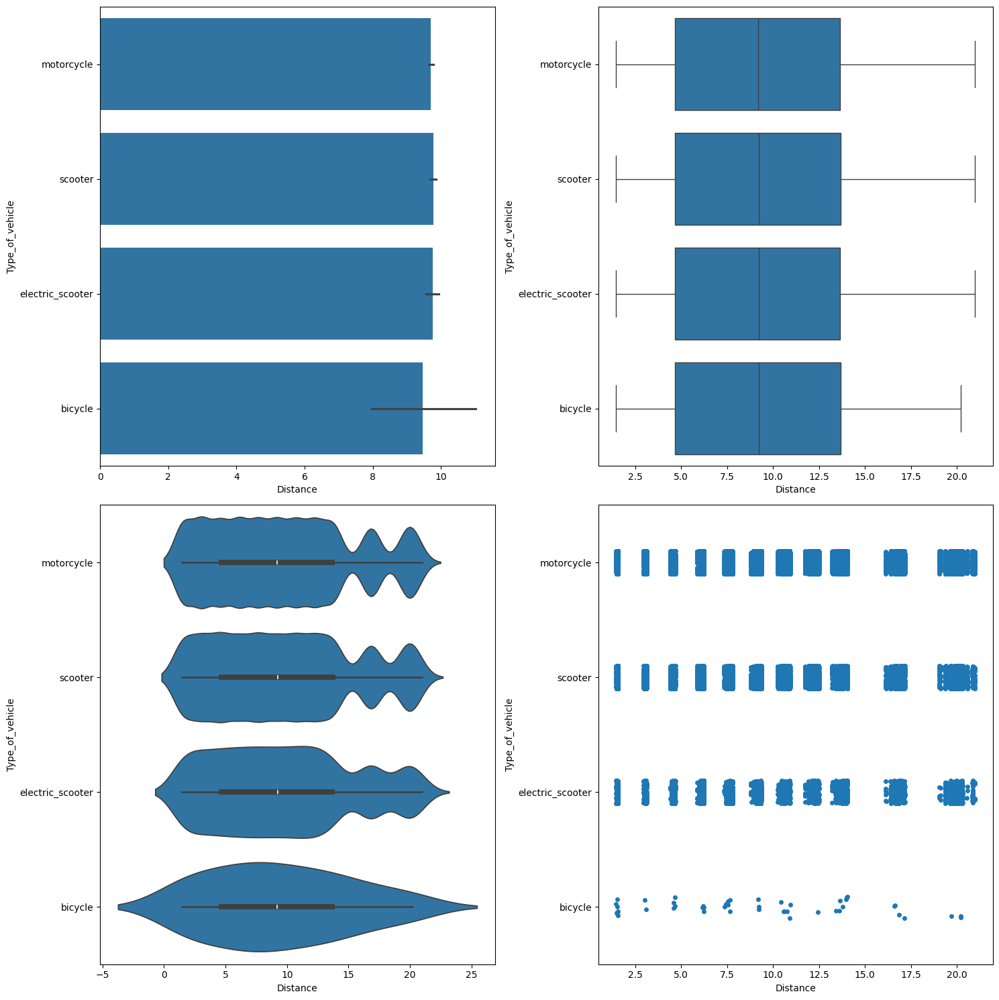

In [91]:
bivariate_analysis(df, "Distance", "Type_of_vehicle")